# Line2Image Model
_________________________________________
Motivation:  
The idea of giving sketches (lines) and having the model bring it to life (actual images) seems like very interesting way to demonstrate how a model can learn to create something out of nothing (much).

#### **Dataset used:**   
COCO Dataset.   
Because common objects seems like a good general place to extract features from lines.

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf

import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import cv2
import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pandas as pd

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Reshape, Activation
from tensorflow.keras.layers import UpSampling2D, Concatenate, BatchNormalization, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow.keras.backend as K
from tensorflow.keras.utils import plot_model

In [ ]:
## Just for saving the model afterwards
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin = 'http://images.cocodataset.org/zips/train2014.zip',
                                      extract = True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

13510574080/13510573713 [==============================] - 428s 0us/step


Taking only 30,000 images to making training time shorter.

In [ ]:
images_dataset = []
for root, dirs, files in os.walk(PATH, topdown=True):
  for name in files:
    if '.jpg' not in name:
      continue
    filename = os.path.abspath(os.path.join(root, name))
    images_dataset.append(filename)

images_dataset = np.array(images_dataset)
images_dataset = images_dataset[:30000]
images_dataset = shuffle(images_dataset)

To create a dataset, I used the canny edge detection method to extract the edges from an actual image. This forms the basis of the sketches.   
**Input:** Sketches   (edges)  
**Output:** Actual images   


In [ ]:
def canny(image_path):  
  image = np.array(Image.open(image_path).resize((224,224)))
  canny_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  low_thresh = 90
  canny_img = cv2.Canny(canny_img,low_thresh,low_thresh*2.5)
  canny_img = np.expand_dims(canny_img, 2).astype(np.float32)
  canny_img = np.tile(canny_img, (1,1,3))
  return canny_img

### Creating a Data pipeline

In [ ]:
batch_size = 32

split = int(0.9*len(images_dataset))


train = images_dataset[:split]
test = images_dataset[split:]
print('train_size: ', len(train))
print('test_size: ', len(test))

train_size:  27000
test_size:  3000


#### Some examples

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)


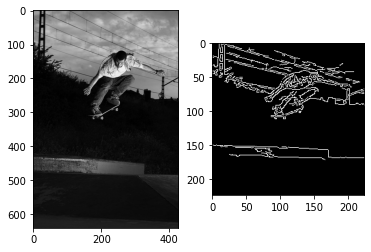

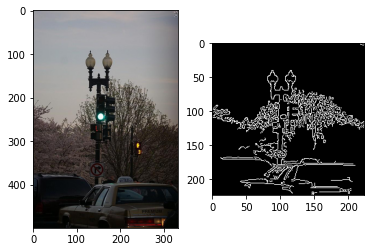

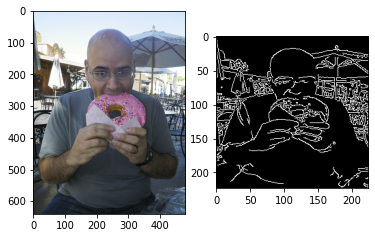

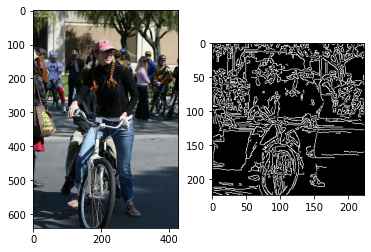

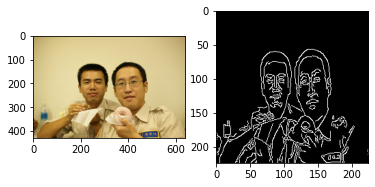

In [ ]:
def show_eg():
  fig, (ax1,ax2) = plt.subplots(1,2)

  # Look at some examples
  sample_idx = np.random.randint(len(train))
  original = train[sample_idx]
  original_img = np.array(Image.open(original))
  ax1.imshow(original_img)

  lines = canny(original)

  ax2.imshow(lines)
  print(lines.shape)

for i in range(5):
  show_eg()

In [ ]:
def data_generator(dataset):
  while True:
    for image_path in dataset:
      try:
        original = Image.open(image_path).resize((224,224))
        original = np.array(original).astype(np.float32)
        lines = canny(image_path)

        # normalize images
        lines /= 255.
        lines -= lines.mean()
        if lines.std() != 0:
          lines /= lines.std()

        yield ((np.array(lines), np.array(original)), np.zeros((512))) #target to match output of vgg
      except:
        pass  

In [ ]:
shapes = (([224,224,3], [224,224,3]), [512])

#train
train_generator = tf.data.Dataset.from_generator(lambda: data_generator(train), output_types=((tf.float32, tf.float32),tf.float32), output_shapes = shapes).batch(batch_size, drop_remainder = True)
test_generator = tf.data.Dataset.from_generator(lambda: data_generator(test), output_types=((tf.float32, tf.float32),tf.float32), output_shapes = shapes).batch(batch_size, drop_remainder = True)

## Create the model!
U-Net for image generation --> VGG for feature extraction

### Start with our generator model

In [ ]:
def down_block(x, filters, block_name):
  x = Conv2D(filters, (3,3), activation='relu', padding='same', name = block_name+'_conv1')(x)
  conv = Conv2D(filters, (3,3), activation='relu', padding='same', name = block_name+'_conv2')(x)
  pool = MaxPooling2D(pool_size=(2,2), name = block_name+'_pool')(conv)
  output = BatchNormalization(name=block_name+'_batchnorm')(pool)
  return conv, output

def up_block(conv1, conv2, filters, block_name):
  up = Concatenate(axis=3, name = block_name+'_concatenate')([UpSampling2D(size=(2, 2))(conv1), conv2])
  conv = Conv2D(filters, (1, 1), activation='relu', padding='same', name = block_name+'_conv1')(up)
  conv = Conv2D(filters, (3, 3), activation='relu', padding='same', name = block_name+'_conv2')(conv)
  conv = Conv2D(filters, (3, 3), activation='relu', padding='same', name = block_name+'_conv3')(conv)
  conv = BatchNormalization(name=block_name+'_batchnorm')(conv)
  return conv

In [ ]:
def create_creative_model():
  # down
  input = Input(shape=(224,224,3))
  conv1, x = down_block(input, 32, 'down_block1')
  conv2, x = down_block(x, 64, 'down_block2')
  conv3, x = down_block(x, 128, 'down_block3')
  conv4, x = down_block(x, 256, 'down_block4')
  conv5, x = down_block(x, 512, 'down_block5')
  
  conv6 = Conv2D(1024, (3, 3), activation='relu', padding='same')(x)
  conv6 = Conv2D(1024, (3, 3), activation='relu', padding='same')(conv6)

  # up
  conv7 = up_block(conv6, conv5, 512, 'up_block1')
  conv8 = up_block(conv7, conv4, 256, 'up_block2')
  conv9 = up_block(conv8, conv3, 128, 'up_block3')
  conv10 = up_block(conv9, conv2, 64, 'up_block4')
  conv11 = up_block(conv10, conv1, 32, 'up_block5')

  conv12 = Conv2D(3, (1, 1))(conv11) # 3 channel output 
  conv12 = Activation('tanh')(conv12) 
  outp = Lambda(lambda x: (x+1)*127.5)(conv12)
  
  model = Model(input, outp)
  return model

In [ ]:
creative_model = create_creative_model()

In [ ]:
creative_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
down_block1_conv1 (Conv2D)      (None, 224, 224, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
down_block1_conv2 (Conv2D)      (None, 224, 224, 32) 9248        down_block1_conv1[0][0]          
__________________________________________________________________________________________________
down_block1_pool (MaxPooling2D) (None, 112, 112, 32) 0           down_block1_conv2[0][0]          
______________________________________________________________________________________________

### Then our feature extractor using VGG
(tried using Block4_Conv3 and Block2_Conv2 as the output feature layer. Results are shown further down)

In [ ]:
#vgg preproc
rn_mean = np.array([123.68, 116.779, 103.939], dtype=np.float32)
preproc = lambda x: (x - rn_mean)[:, :, :, ::-1]

def create_feature_extractor():
  input = Input(shape=(224,224,3))
  vgg_inp = Lambda(preproc)(input)
  vgg_model = tf.keras.applications.VGG16(weights='imagenet',
                                          include_top = False,
                                          input_tensor = vgg_inp)
  for layer in vgg_model.layers:
    layer.trainable = False
  output = vgg_model.get_layer('block4_conv3').output
  return Model(input, output)
  

In [ ]:
feature_extractor = create_feature_extractor()
feature_extractor.summary()

58892288/58889256 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
____________________________________________________________

## Putting it all together!

In [ ]:
def create_model():
  input_lines = Input(shape=(224,224,3))
  input_original = Input(shape=(224,224,3))

  # create art
  generated_creative = creative_model(input_lines)

  # get features
  vgg_generated = feature_extractor(generated_creative)
  vgg_original = feature_extractor(input_original)

  # push loss between images 0
  loss = Lambda(lambda x: K.sqrt(K.mean((x[0]-x[1])**2, (1,2))))([vgg_generated, vgg_original])
  return Model((input_lines, input_original), loss)

In [ ]:
model = create_model()

### Looks simple enough


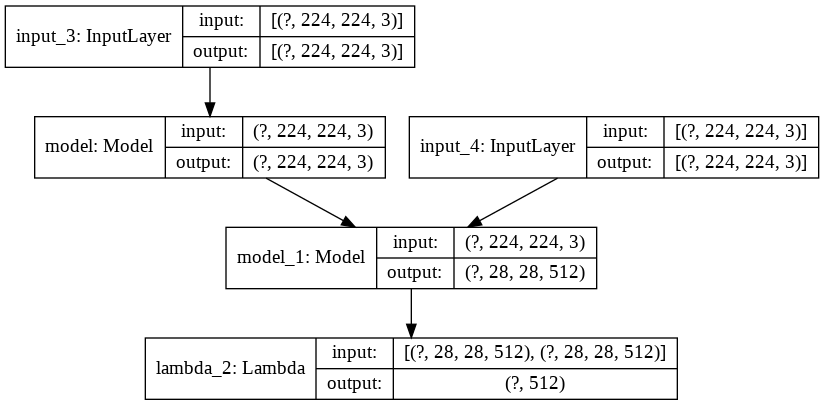

In [ ]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

## Getting to training

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
model.compile(
    optimizer = opt,
    loss = 'mean_squared_error'
)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.9, patience=2, min_lr=0.00001)

In [ ]:
train_steps = int(len(train)/batch_size)
test_steps = int(len(test)/batch_size)

print('train steps: ', train_steps)
print('test steps: ', test_steps)

train steps:  843
test steps:  93


Saved and load weights to continue training between sessions because Google Colab has a limit on GPU usage

In [ ]:
model.load_weights('/content/drive/My Drive/Colab Notebooks/creative_model_b4c3_weights.h5')

In [ ]:
### Training takes too long, so shall load the model that I had trained previously ###


# model.fit(train_generator,
#           steps_per_epoch = train_steps,
#           epochs = 20,
#           validation_data = test_generator,
#           validation_steps = test_steps,
#           validation_freq = 10,
#           callbacks = [reduce_lr])

In [ ]:
# creative_model.save('/content/drive/My Drive/Colab Notebooks/creative_model_b4c3_1.h5')
# model.save_weights('/content/drive/My Drive/Colab Notebooks/creative_model_b4c3_weights.h5', overwrite=True)

## Load the trained models
Trained for about 6 hours on GPU for each model


In [ ]:
model_b4c3 = tf.keras.models.load_model('/content/drive/My Drive/Colab Notebooks/creative_model_b4c3_1.h5')
model_b2c2 = tf.keras.models.load_model('/content/drive/My Drive/Colab Notebooks/creative_model_b2c2_1.h5')

## Lets see the results :D   
It's not as expected but surprisingly pleasing. 

In [ ]:
def preproc_image(image_path):
  lines = canny(image_path) #create lines input
  
  # normalize
  lines /= 255.
  lines -= lines.mean()
  lines /= lines.std()
  lines = np.expand_dims(lines, 0)
  return lines

# for visualizing 3 images
def plot_images(lines, generated, troof):
  fig = plt.figure(figsize=(30,30))
  a = fig.add_subplot(1,3,1)
  imgplot = plt.imshow(lines)
  a = fig.add_subplot(1,3,2)
  imgplot = plt.imshow(generated)
  a = fig.add_subplot(1,3,3)
  imgplot = plt.imshow(troof)

# for visualizing 2 images
def plot_own(lines, predicted):
  fig = plt.figure(figsize=(30,30))
  a = fig.add_subplot(1,2,1)
  imgplot = plt.imshow(lines)
  a = fig.add_subplot(1,2,2)
  imgplot = plt.imshow(predicted)

In [ ]:
def test_b2c2(img_path):
  # get original image for plot
  original = np.array(Image.open(img_path))

  # line representation
  line_input = preproc_image(img_path) # for generation
  line_show = canny(img_path)  # for display

  ## Make the new picture!
  generated_img = model_b2c2.predict(line_input)
  generated_img = np.reshape(generated_img, (224,224,3))

  ## Display
  print("Lines, Generated, Original")
  plot_images(line_show.astype('uint8'), generated_img.astype('uint8'), original.astype('uint8'))

def test_b4c3(img_path):
  # get original image for plot
  original = np.array(Image.open(img_path))

  # line representation
  line_input = preproc_image(img_path) # for generation
  line_show = canny(img_path)  # for display

  ## Make the new picture!
  generated_img = model_b4c3.predict(line_input)
  generated_img = np.reshape(generated_img, (224,224,3))

  ## Display
  print("Lines, Generated, Original")
  plot_images(line_show.astype('uint8'), generated_img.astype('uint8'), original.astype('uint8'))

## Result of model trained from block 4 conv 3 feature layer
Observations:  
Appears that the model was able to get the general color schema alright. E.g. sky is usually of a lighter colour than the objects. But still a rather poor representation of the actual image. I guess things that have an outline similar to a box could be anything really, which makes it difficult to really identify what is the object and colour it based on the edges alone


Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original


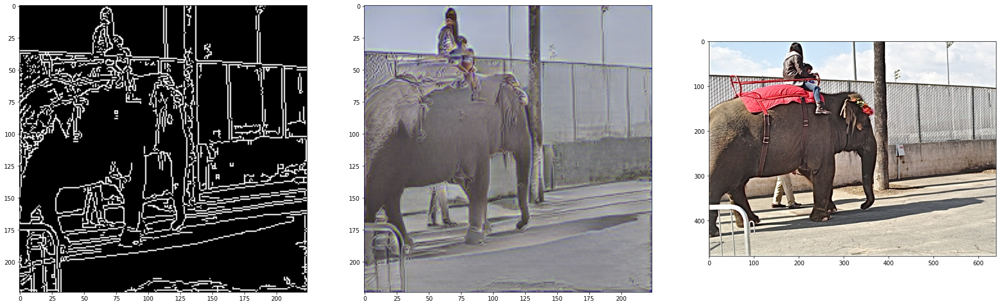

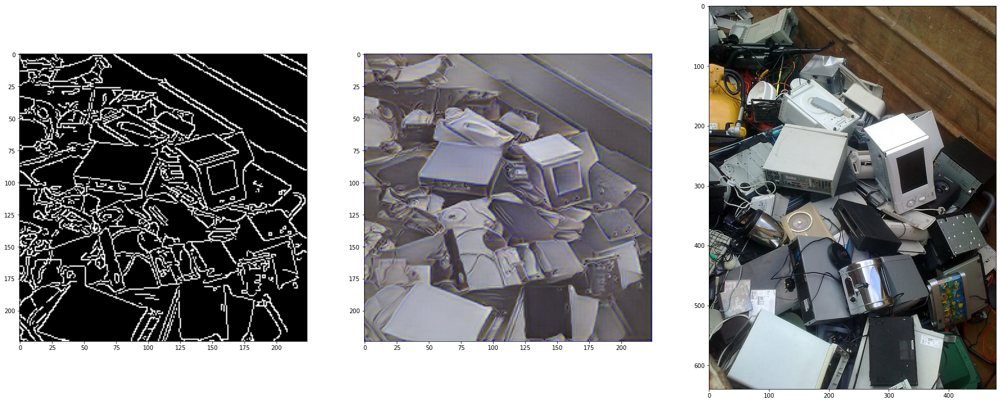

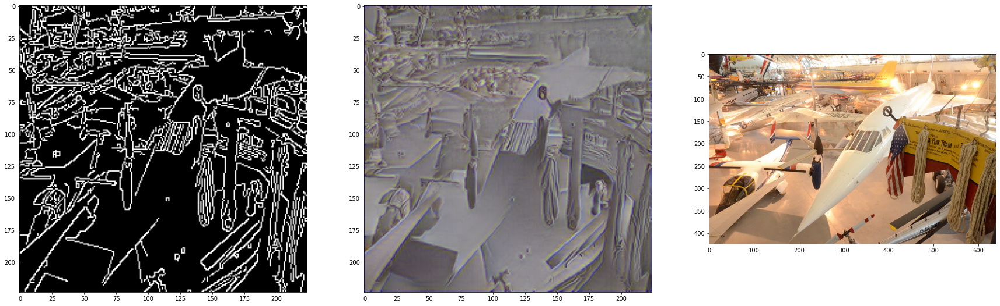

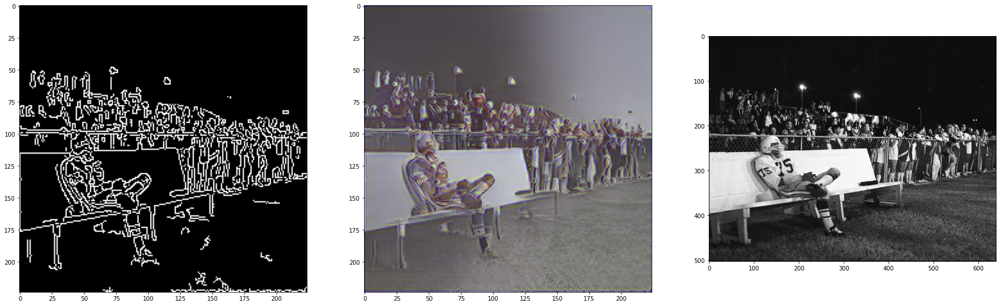

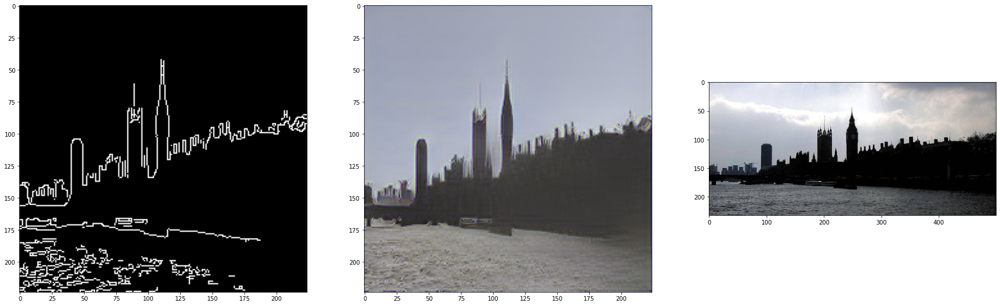

In [ ]:
for i in range(5):
  test_idx = np.random.randint(len(test))
  img_path_1 = test[test_idx]
  test_b4c3(img_path_1)

I guess there's too little to infer from simplistic drawings?

Lines, Generated, Original


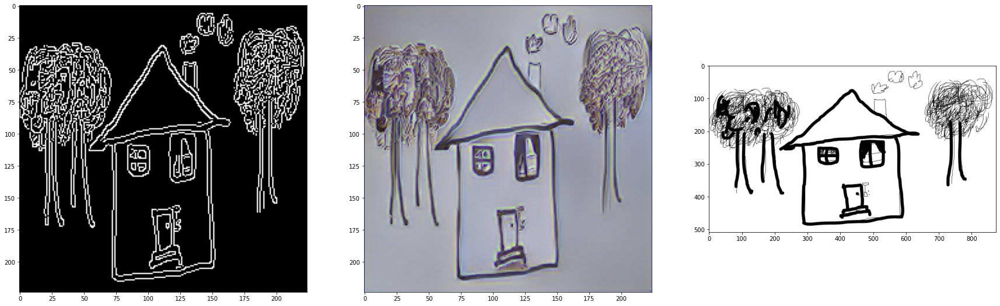

In [ ]:
# insert your own image path
own_image_path = 'test_img.JPG'

test_b4c3(own_image_path)

## Result of model trained from block 2 conv 2 feature layer

Learning from the features of an earlier feature layer seems to have some pleasing results.
The model has learnt the textures and shades to give its own 'oil-painting' like rendition of the original image. It's considerably artistic. Like the first image and the one on of a cake below!

I approve.

Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original
Lines, Generated, Original


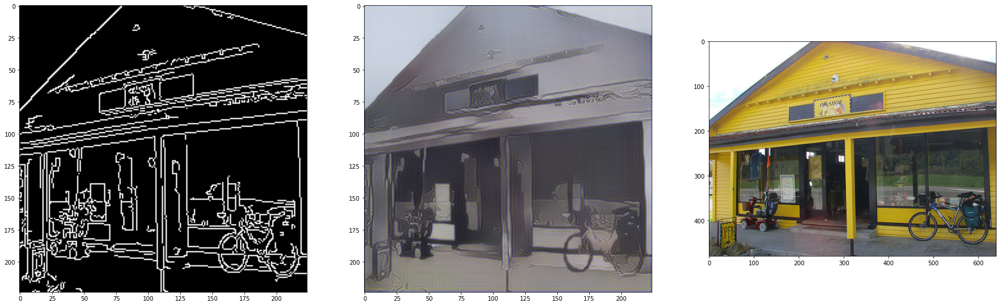

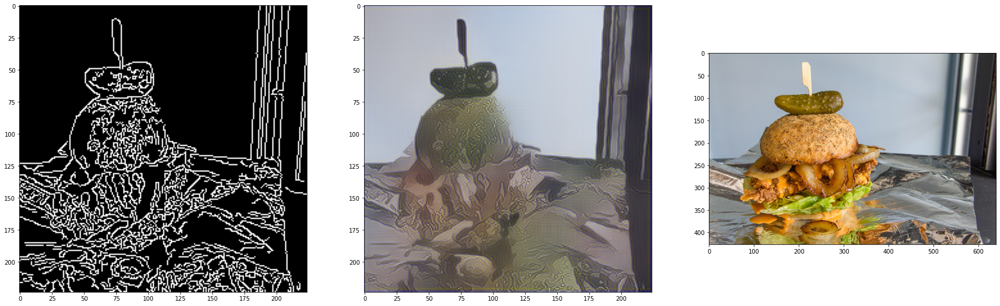

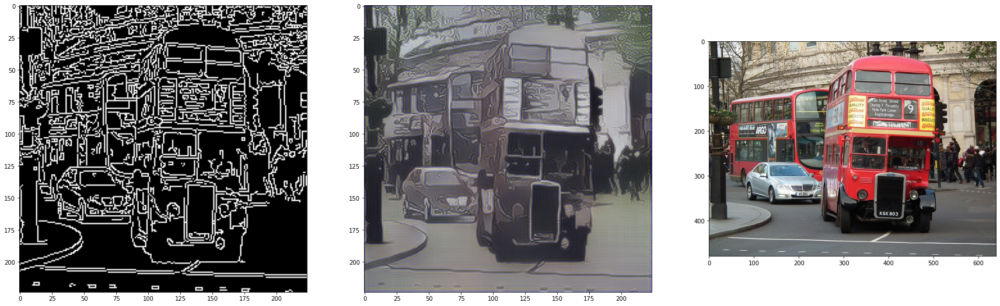

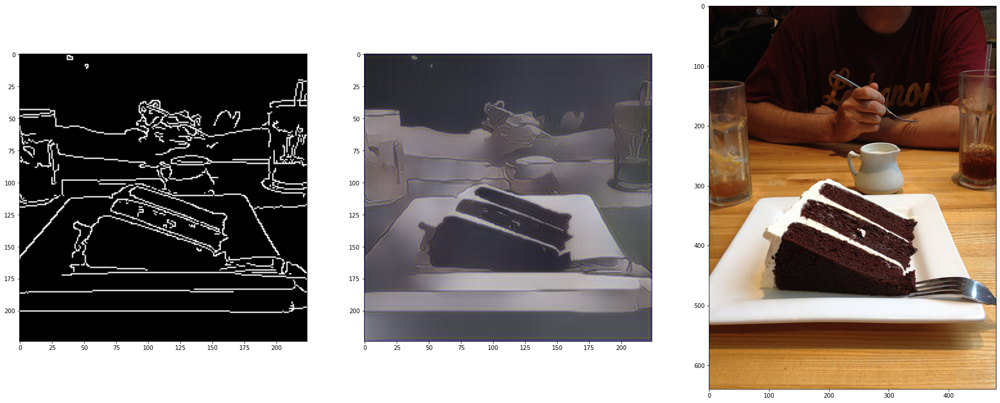

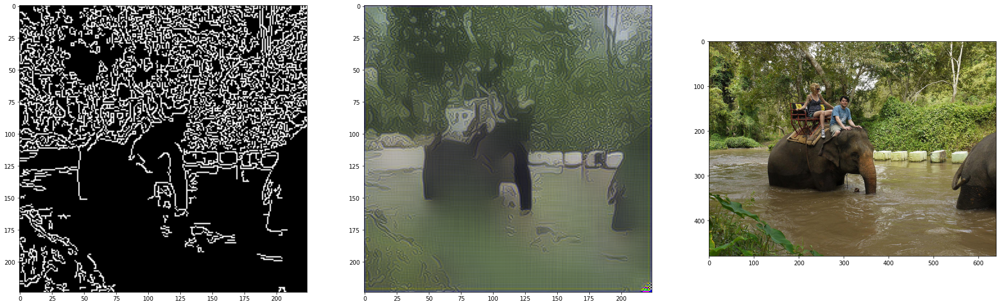

In [ ]:
for i in range(5):
  test_idx = np.random.randint(len(test))
  img_path_2 = test[test_idx]

  test_b2c2(img_path_2)

I guess based on the quality of my training images, this model still requires a decent artist to draw a sketch necessary to produce a nice image :' )

Lines, Generated, Original


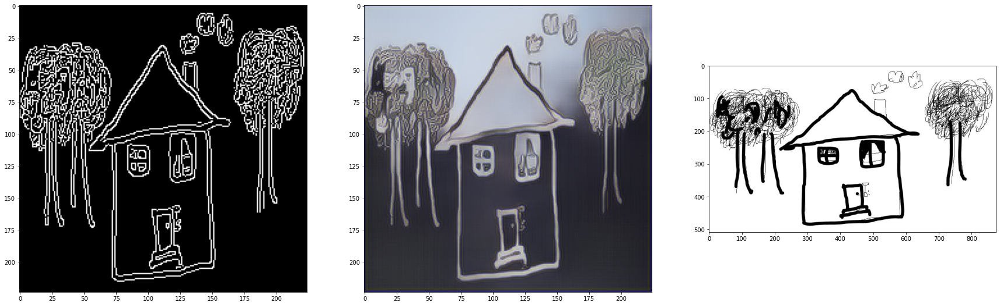

In [ ]:
# insert your own image path
own_image_path = 'test_img.JPG'

test_b2c2(own_image_path)